In [9]:
!pip install pgl 

  Using cached pgl-2.2.3.post0-cp39-cp39-win_amd64.whl (7.9 MB)
  Using cached Cython-3.0.10-cp39-cp39-win_amd64.whl (2.8 MB)



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
import os
import sys
import re
import time
import tqdm
import argparse
import unittest
import shutil
import numpy as np
import paddle

from pgl.utils.logger import log


ModuleNotFoundError: No module named 'paddle.fluid'

In [7]:
!pip install paddlepaddle

  Using cached paddlepaddle-2.6.1-cp39-cp39-win_amd64.whl (81.0 MB)
  Using cached astor-0.8.1-py2.py3-none-any.whl (27 kB)



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
!pip install pydicom


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
!pip install nibabel


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import nibabel as nib

In [ ]:
path="archive1/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_3_1/BraTS19_2013_3_1_seg.nii"

In [ ]:
import nibabel as nib

# Load the image
img = nib.load('archive1/MICCAI_BraTS_2019_Data_Training/HGG/BraTS19_2013_3_1/BraTS19_2013_3_1_seg.nii')

# Get the header
header = img.header

# Print the voxel sizes
print(header.get_zooms())

(1.0, 1.0, 1.0)


In [ ]:
img = nib.load(path).get_fdata()
img.shape

(240, 240, 155)

In [ ]:
from glob import glob
import matplotlib.pylab as plt

import pydicom as dicom

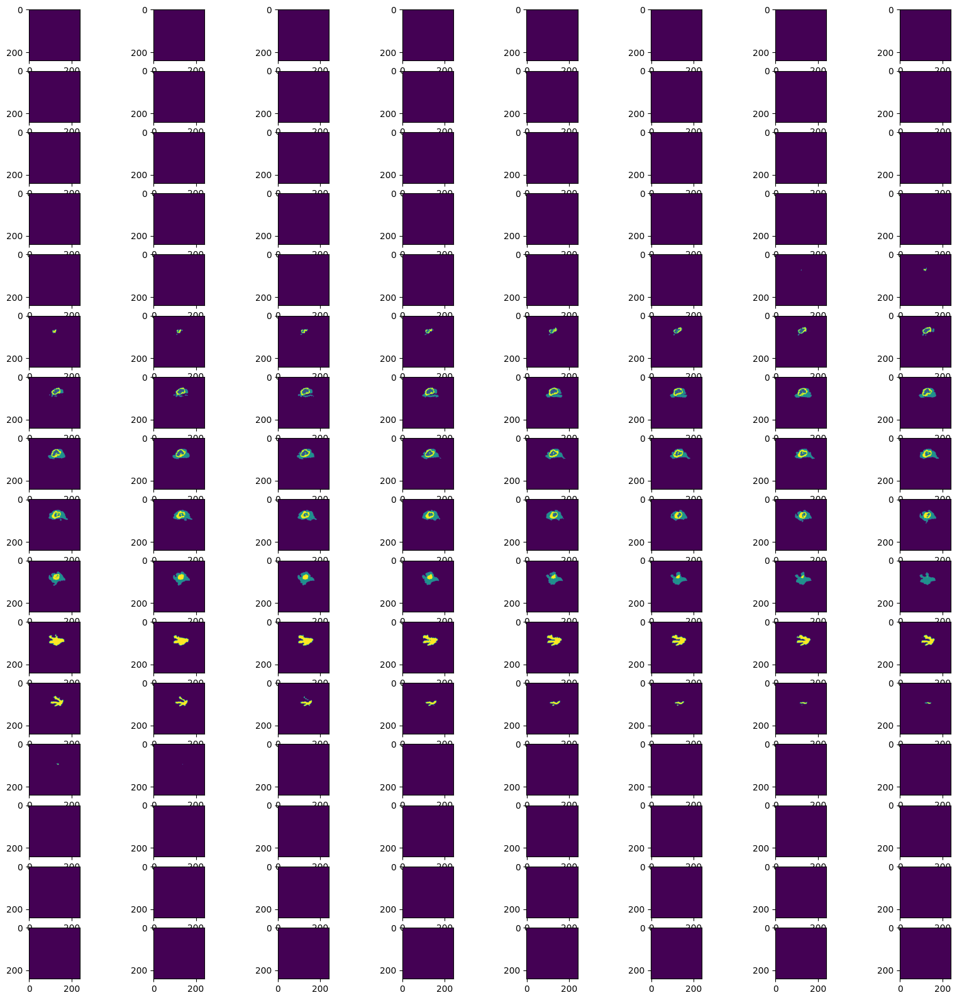

In [ ]:
plt.style.use('default')
fig, axes = plt.subplots(16,8, figsize=(20,20))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i])
plt.show()

In [ ]:
def highlight_segments(image, segments, segments_to_highlight, highlight_color=[1, 0, 0]):
    """
    Highlight specific segments in an image.
    
    Parameters:
        image (numpy.ndarray): The input image.
        segments (numpy.ndarray): The segmentation map.
        segments_to_highlight (list): List of segment labels to highlight.
        highlight_color (list): RGB color to use for highlighting.
    
    Returns:
        numpy.ndarray: Image with highlighted segments.
    """
    highlight_mask = np.isin(segments, segments_to_highlight)

    highlighted_image = image.copy()
    highlighted_image[highlight_mask] = highlight_color

    return highlighted_image

(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 240, 155)
(240, 24

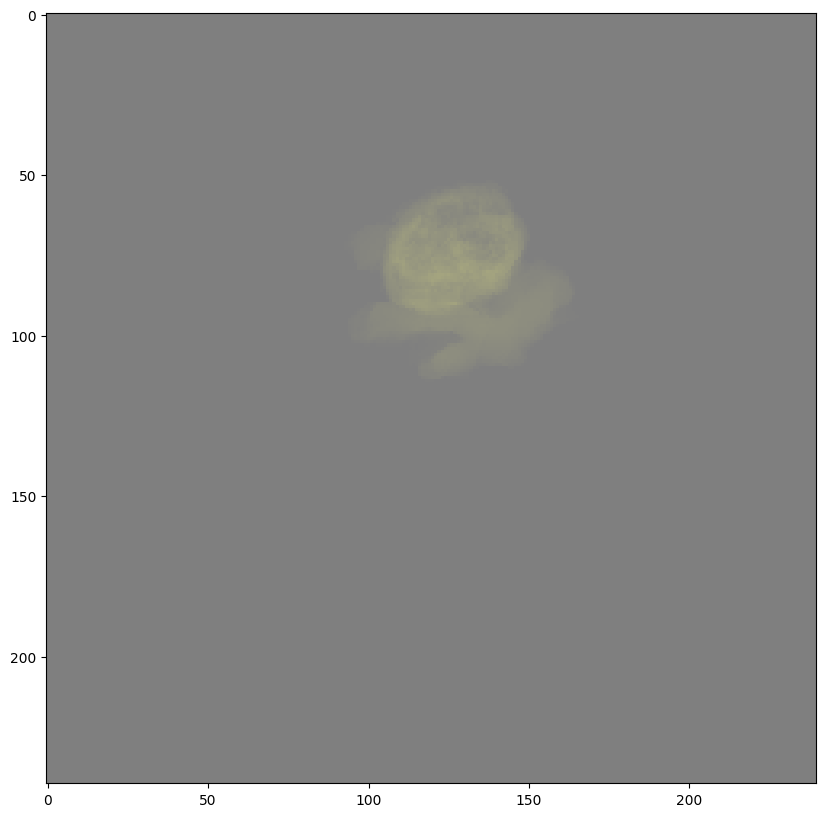

In [ ]:
plt.style.use('default')
fig, ax = plt.subplots(figsize=(10,10))
for i in range(16*8):
    ax.imshow(img[:,:,1 + i], alpha=0.005) 
    print(img.shape) # alpha is for transparency
plt.show()

In [ ]:
import os
import gc
from torch import nn
import torch.nn.functional as f
import torch
import torchio as tio
from torch.utils.data import DataLoader
import numpy as np
import wandb



from tqdm import tqdm
import matplotlib.pyplot as plt
from skimage.util import montage

c:\g\pproject\aimbot\bot\bot\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
!pip install wandb



[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
!pip install torchio


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
data_dir = 'archive1/MICCAI_BraTS_2019_Data_Training/HGG'
Patient_info = [(f.path, f.name) for f in (os.scandir(data_dir)) if f.is_dir()]
sorted_patient_info = sorted(Patient_info, key=lambda param: param[1])
Patient_paths, Patient_names = zip(*sorted_patient_info)
subjects = []
for path, name in tqdm(zip(Patient_paths[:200], Patient_names[:200])):
    subject = tio.Subject(
        image=tio.ScalarImage(f"{path}/{name}_t1ce.nii"),
        label=tio.LabelMap(f"{path}/{name}_seg.nii"))
    lbl_temp = subject['label'][tio.DATA]
    subject['label'][tio.DATA] = np.concatenate((lbl_temp == 2, (lbl_temp == 1) | (lbl_temp == 4)), axis=0).astype(np.float32)
    subject['image'][tio.DATA] = subject['image'][tio.DATA].to(torch.float32)
    
    subjects.append(subject)
dataset = tio.SubjectsDataset(subjects)
print('Dataset size:', len(dataset), 'subjects')

0it [00:00, ?it/s]

200it [01:01,  3.24it/s]

Dataset size: 200 subjects


In [ ]:
training_transform = tio.Compose([
    # tio.CropOrPad((240, 240, 128)),
    # tio.Resize((128, 128, 128)),
    tio.ZNormalization(masking_method=tio.ZNormalization.mean),
    tio.RescaleIntensity((0, 1), (0, 100)),
    tio.RandomNoise(p=0.2),
    tio.RandomFlip(),
    tio.OneOf({
        tio.RandomAffine(): 0.8,
        tio.RandomElasticDeformation(): 0.2,
    }),
])

validation_transform = tio.Compose([
    # tio.CropOrPad((240, 240, 128)),
    # tio.Resize((128, 128, 128)),
    tio.ZNormalization(masking_method=tio.ZNormalization.mean),
    tio.RescaleIntensity((0, 1), (0, 100)),
    # tio.OneHot(),
])

training_split_ratio = 0.8

num_sub = len(dataset)
num_train = int(training_split_ratio * num_sub)

training_subjects, validation_subjects = torch.utils.data.random_split(dataset, [num_train, num_sub - num_train])
training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

training_batch_size = 1
validation_batch_size = 1

train_dataloader = DataLoader(training_set, batch_size=training_batch_size)
val_dataloader = DataLoader(validation_set, batch_size=validation_batch_size)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


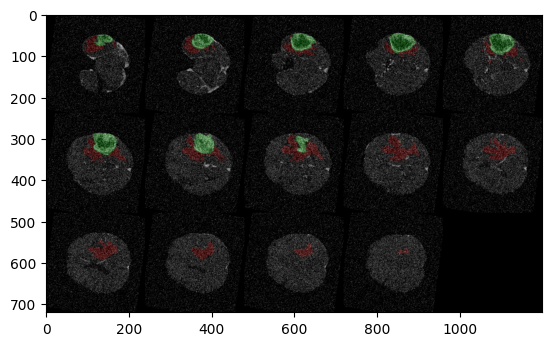

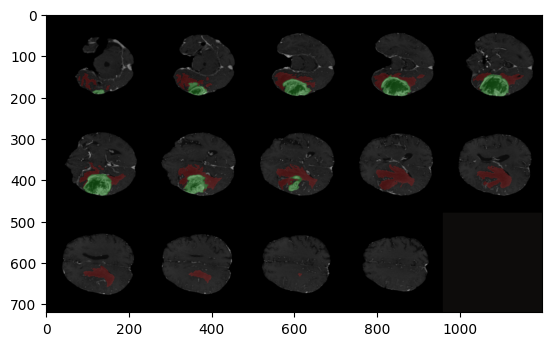

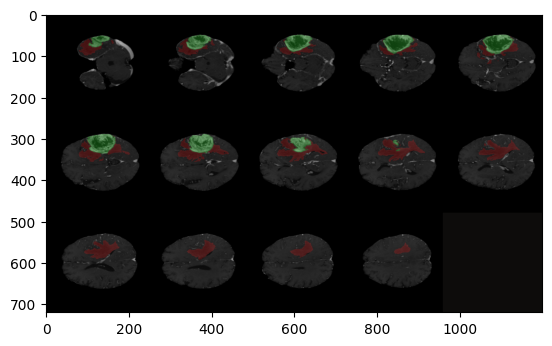

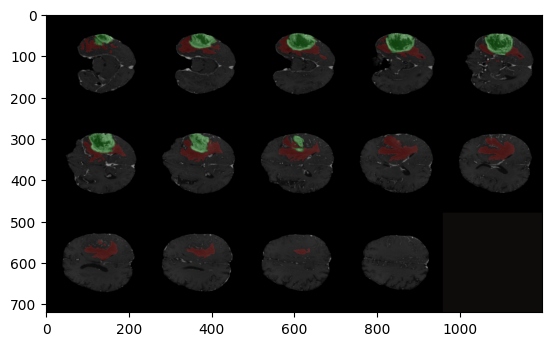

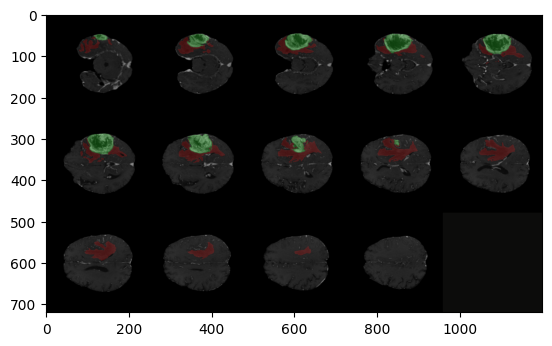

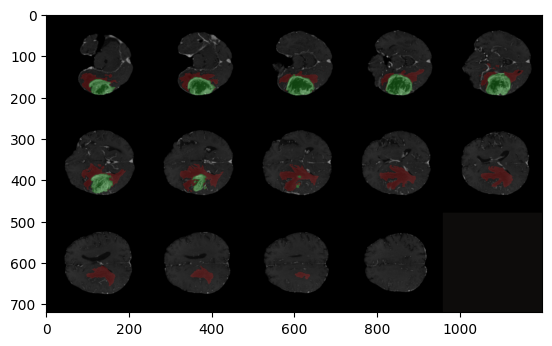

In [ ]:
color_img = np.zeros([1, 240, 240, 155, 3])
color_mask = np.zeros([1, 240, 240, 155, 3])
l=[0,1,2,3,4,5]
for k in l:
    train_sample = next(iter(train_dataloader))
    x = train_sample['image'][tio.DATA]
    y = train_sample['label'][tio.DATA]

    color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
    for i in range(2):
        color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
    mixed = 0.8*color_img + 0.2*color_mask
    slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
    plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
    plt.show()

In [ ]:
# data_dir = 'archive1/MICCAI_BraTS_2019_Data_Training/HGG'
# Patient_info = [(f.path, f.name) for f in (os.scandir(data_dir)) if f.is_dir()]
# sorted_patient_info = sorted(Patient_info, key=lambda param: param[1])
# Patient_paths, Patient_names = zip(*sorted_patient_info)
# subjects = []
# for path, name in tqdm(zip(Patient_paths[:200], Patient_names[:200])):
#     subject = tio.Subject(
#         image=tio.ScalarImage(f"{path}/{name}_t1ce.nii"),
#         label=tio.LabelMap(f"{path}/{name}_seg.nii"))
#     lbl_temp = subject['label'][tio.DATA]
#     subject['label'][tio.DATA] = np.concatenate((lbl_temp == 2, (lbl_temp == 1) | (lbl_temp == 4)), axis=0).astype(np.float32)
#     subject['image'][tio.DATA] = subject['image'][tio.DATA].to(torch.float32)
    
#     subjects.append(subject)
# dataset = tio.SubjectsDataset(subjects)
# print('Dataset size:', len(dataset), 'subjects')





# training_transform = tio.Compose([
#     tio.CropOrPad((240, 240, 128)),
#     tio.Resize((128, 128, 128)),
#     tio.ZNormalization(masking_method=tio.ZNormalization.mean),
#     tio.RescaleIntensity((0, 1), (0, 100)),
#     tio.RandomNoise(p=0.2),
#     tio.RandomFlip(),
#     tio.OneOf({
#         tio.RandomAffine(): 0.8,
#         tio.RandomElasticDeformation(): 0.2,
#     }),
# ])

# validation_transform = tio.Compose([
#     tio.CropOrPad((240, 240, 128)),
#     tio.Resize((128, 128, 128)),
#     tio.ZNormalization(masking_method=tio.ZNormalization.mean),
#     tio.RescaleIntensity((0, 1), (0, 100)),
#     # tio.OneHot(),
# ])

# training_split_ratio = 0.8

# num_sub = len(dataset)
# num_train = int(training_split_ratio * num_sub)

# training_subjects, validation_subjects = torch.utils.data.random_split(dataset, [num_train, num_sub - num_train])
# training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
# validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

# training_batch_size = 1
# validation_batch_size = 1

# train_dataloader = DataLoader(training_set, batch_size=training_batch_size, shuffle=True)
# val_dataloader = DataLoader(validation_set, batch_size=validation_batch_size)






# color_img = np.zeros([1, 128, 128, 128, 3])
# color_mask = np.zeros([1, 128, 128, 128, 3])
# l=[0,1,2,3,4,5]
# for k in l:
#     train_sample = next(iter(train_dataloader))
#     x = train_sample['image'][tio.DATA]
#     y = train_sample['label'][tio.DATA]

#     color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
#     for i in range(2):
#         color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
#     mixed = 0.8*color_img + 0.2*color_mask
#     slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
#     plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
#     plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


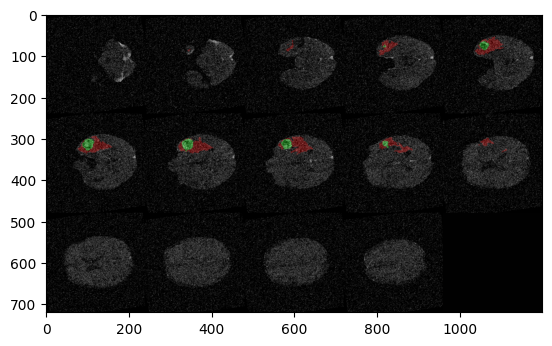

In [ ]:
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]

color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 0.7*color_img + 0.3*color_mask
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
plt.imshow(montage(slices, channel_axis=3, grid_shape=(3,5)), cmap='gray')
plt.show()

In [ ]:
import networkx as nx
from skimage.measure import regionprops
from skimage.color import rgb2gray
def making_graph(image, segments, segments_to_highlight,list_of_labels):
        G = nx.Graph()
        for segVal in segments_to_highlight:
            area = np.sum(segments == segVal)
            noice=0
            intensity = np.mean(image[segments == segVal])
            if segVal in list_of_labels:
                noice=1
            G.add_node(segVal, area=area, intensity=intensity,lable=noice)

        for i, j in np.argwhere(np.isin(segments, segments_to_highlight)):
            window = segments[max(0, i - 1):i + 1, max(0, j - 1):j + 1]
            neighbors = np.unique(window)
            
            for k in range(len(neighbors)):
                for l in range(k + 1, len(neighbors)):
                    if neighbors[l] in segments_to_highlight and neighbors[k] in segments_to_highlight:
                        if G.has_edge(neighbors[k], neighbors[l]):
                            G[neighbors[k]][neighbors[l]]['weight'] = 1
                        else:
                            G.add_edge(neighbors[k], neighbors[l], weight=1)
        return G

In [ ]:
import numpy as np
import networkx as nx

def making_graph(image, segments, segments_to_highlight, list_of_labels):
    G = nx.Graph()
    for segVal in segments_to_highlight:
        area = np.sum(segments == segVal)
        intensity = np.mean(image[segments == segVal])
        noice = 1 if segVal in list_of_labels else 0
        G.add_node(segVal, area=area, intensity=intensity, label=noice)

    # Calculate contact length
    for i in range(segments.shape[0]):
        for j in range(segments.shape[1]):
            if segments[i, j] in segments_to_highlight:
                for di in [-1, 0, 1]:
                    for dj in [-1, 0, 1]:
                        if 0 <= i + di < segments.shape[0] and 0 <= j + dj < segments.shape[1]:
                            neighbor = segments[i + di, j + dj]
                            if neighbor in segments_to_highlight and neighbor != segments[i, j]:
                                if G.has_edge(segments[i, j], neighbor):
                                    G[segments[i, j]][neighbor]['weight'] += 1
                                else:
                                    G.add_edge(segments[i, j], neighbor, weight=1)
    return G

In [ ]:
def average_color(image, segments):
    unique_segments = np.unique(segments)
    avg=0
    for segment_val in unique_segments:
        segment_mask = np.where(segments == segment_val, 1, 0)


        segment_average_color = np.mean(image[segment_mask == 1], axis=0)
        # print(f"Average color of segment {segment_val}: {segment_average_color[1]}")
        avg+=segment_average_color[1]
    return avg/len(unique_segments)


In [ ]:
def high(unique_segments,highlighted_image,segments,avg):
    ele_seg=[]
    for i in range(len(unique_segments)):
        segment_mask = np.where(segments == unique_segments[i], 1, 0)
        segment_average_color = np.mean(highlighted_image[segment_mask == 1], axis=0)
        if segment_average_color[1]>avg:
            ele_seg.append(i+1)
            l.append(segment_average_color[1])
    return ele_seg

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
# shape=color_img.shape
for i in range(2):
    # color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 0.7*color_img + 0.3*color_mask 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 200
graph=[]
for i, slice in enumerate(slices):
    
    segments = slic(slice, n_segments=numSegments, sigma=2)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    graph.append(making_graph(slice, segments,segments_to_highlight))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(slice)
    plt.axis("off")
    plt.show()

TypeError: making_graph() missing 1 required positional argument: 'list_of_labels'

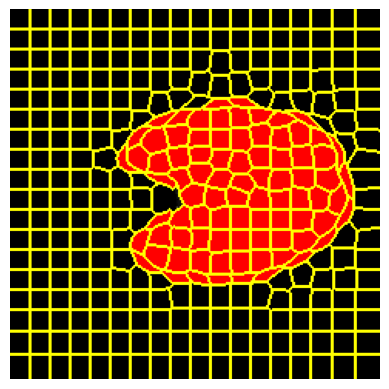

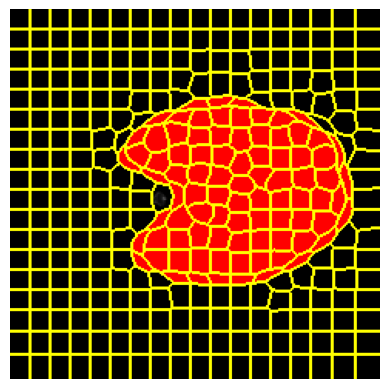

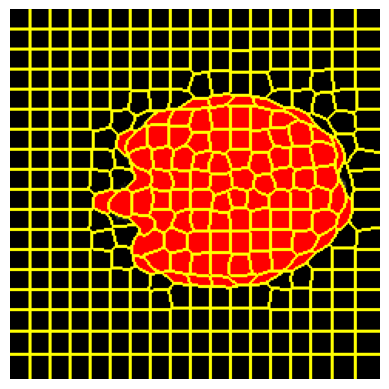

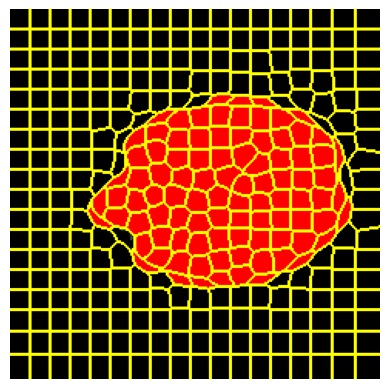

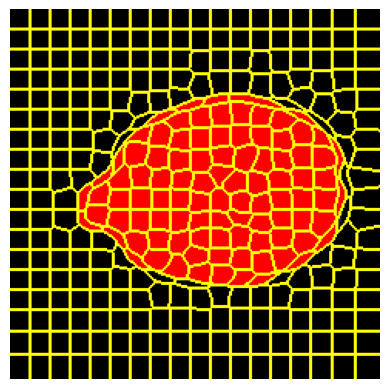

...

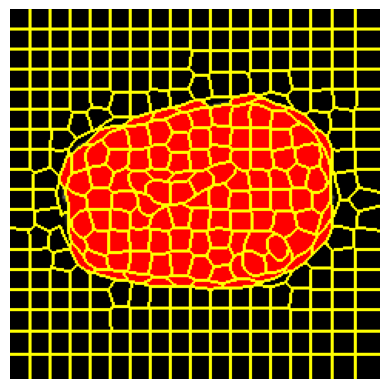

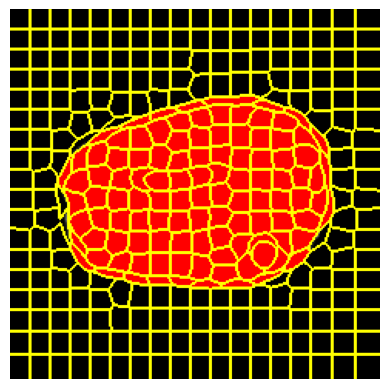

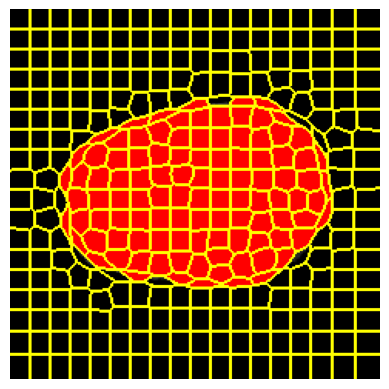

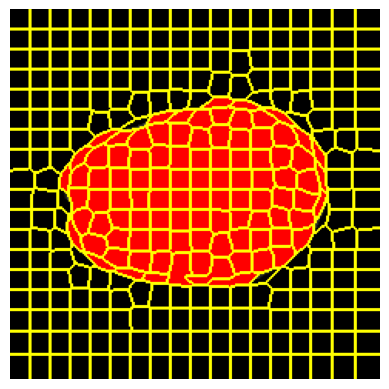

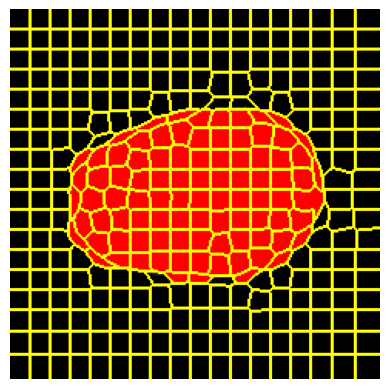

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 1*color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 350
graph=[]
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=4)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    l=[]
    graph.append(making_graph(slice, segments,segments_to_highlight,l))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    highlol=highlight_segments(slice, segments, segments_to_highlight)
    ax.imshow(mark_boundaries(highlol, segments))
    plt.axis("off")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


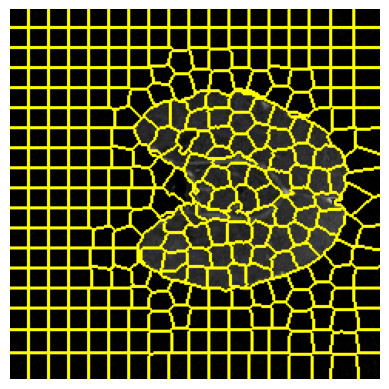

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


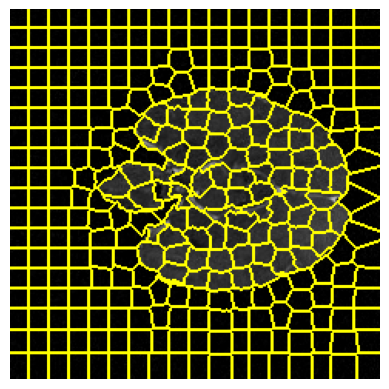

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


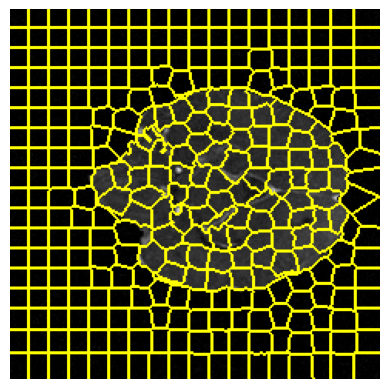

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


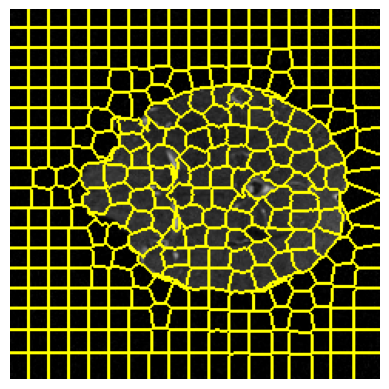

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


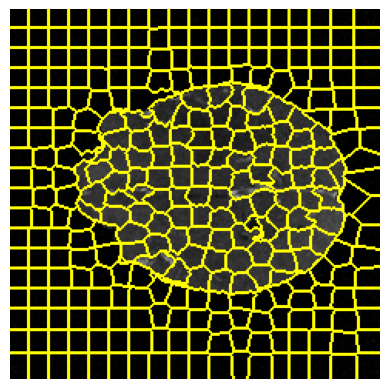

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


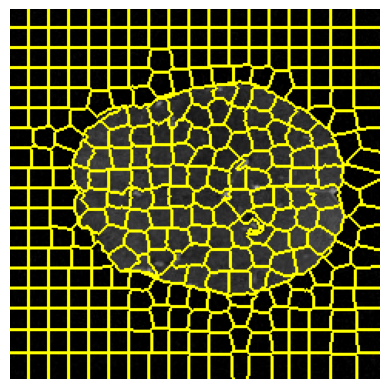

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


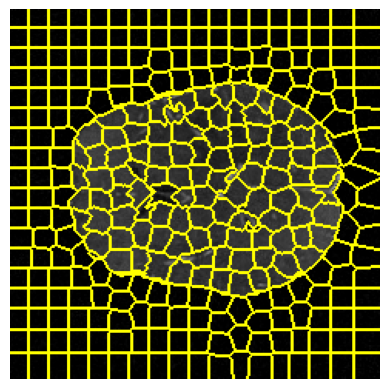

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


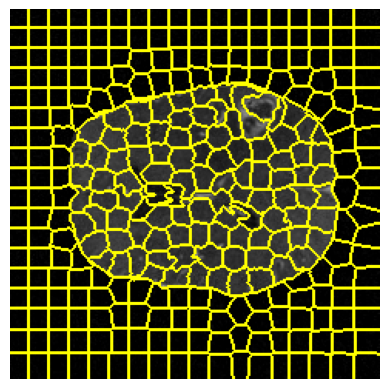

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


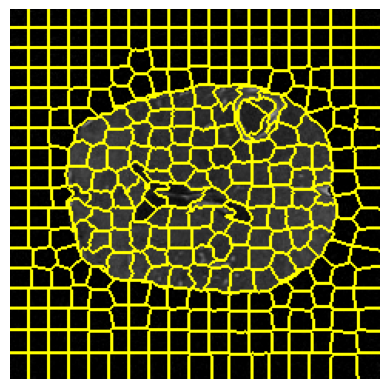

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


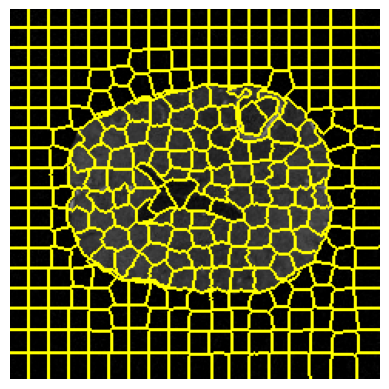

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


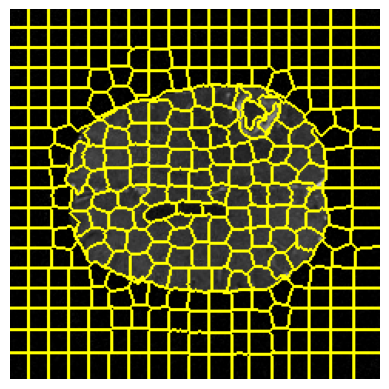

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


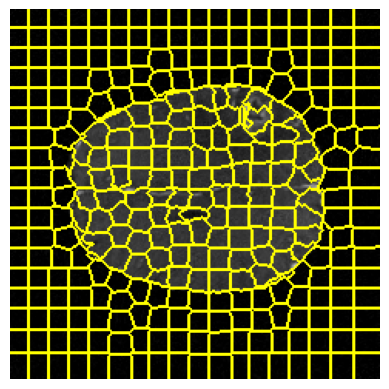

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


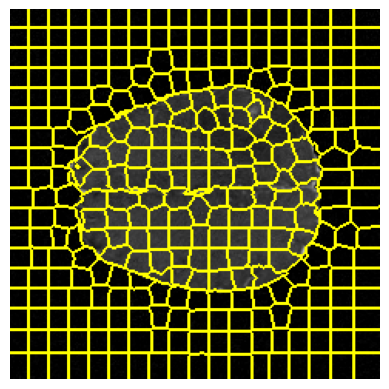

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


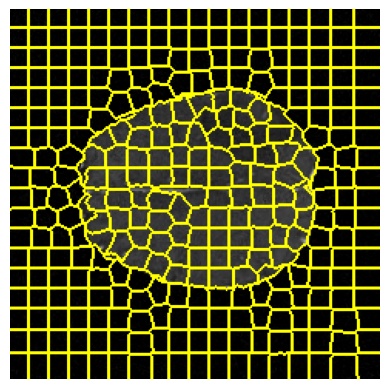

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
from skimage.morphology import dilation

import matplotlib.pyplot as plt
train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0,1].cpu().detach().numpy()

mixed = color_img   
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 350
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=1)

    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    segments_dilated = dilation(segments)

    ax.imshow(mark_boundaries(slice, segments_dilated))
    plt.axis("off")
    plt.show()

torch.Size([1, 1, 240, 240, 155])
torch.Size([1, 2, 240, 240, 155])
(35, 240, 240, 3)
(2, 240, 35, 155)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


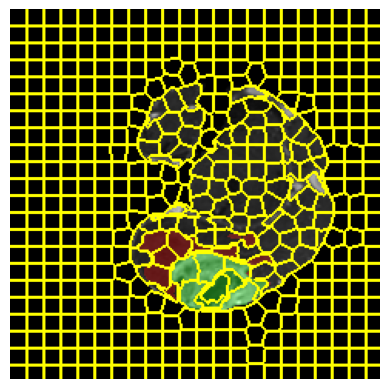

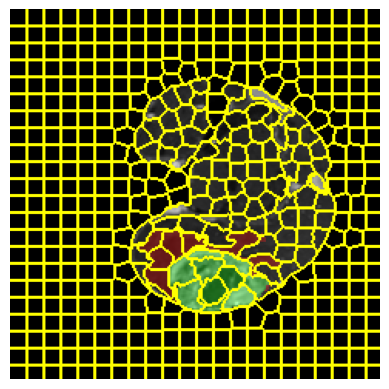

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


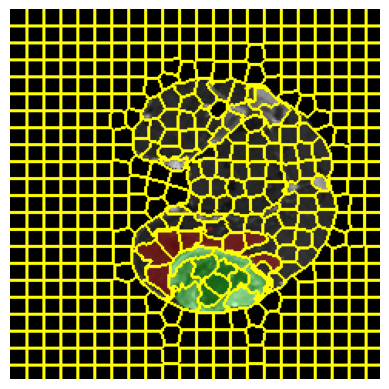

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


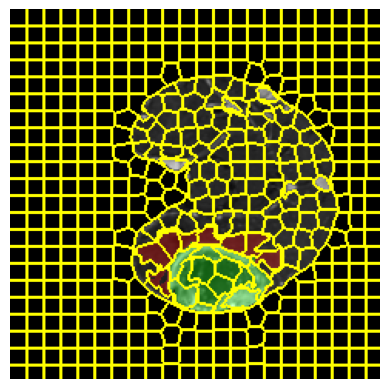

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


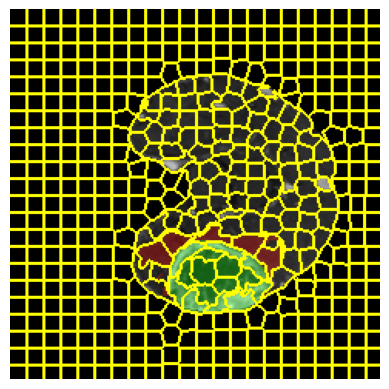

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


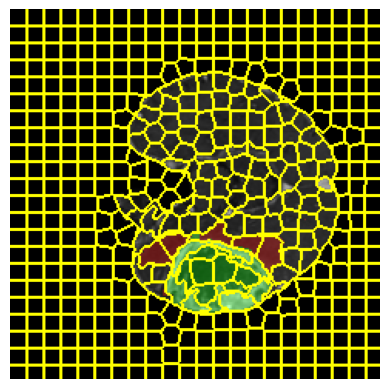

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


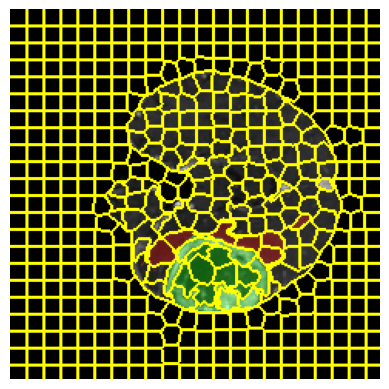

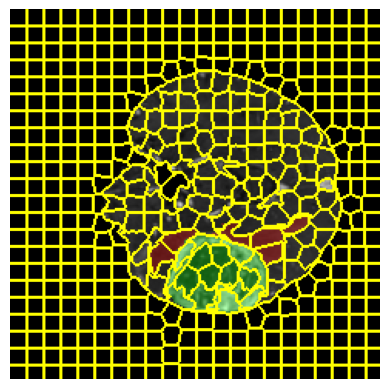

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


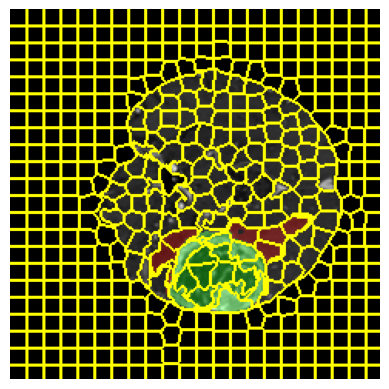

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


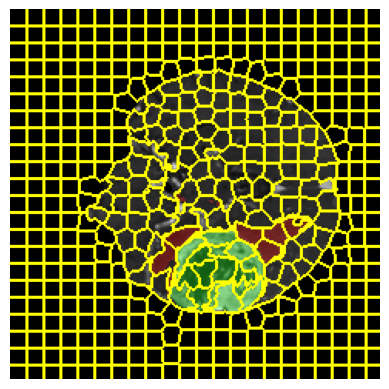

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


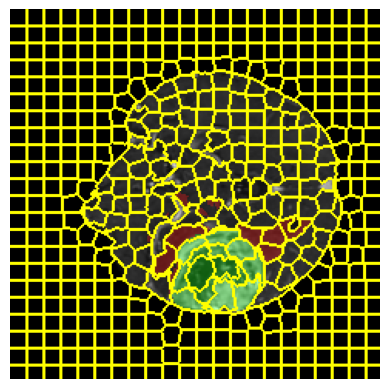

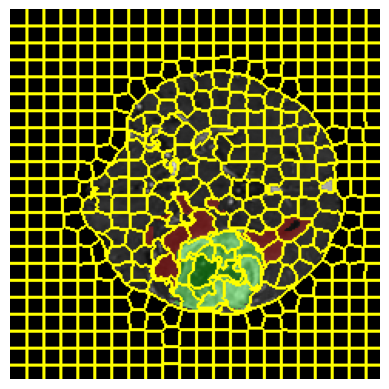

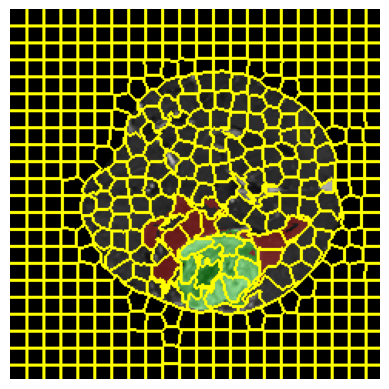

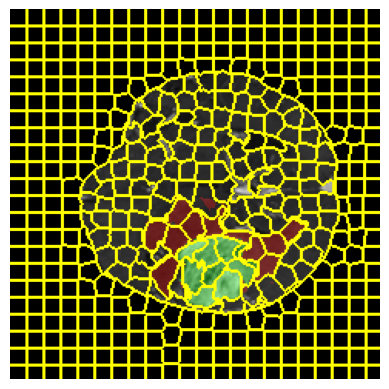

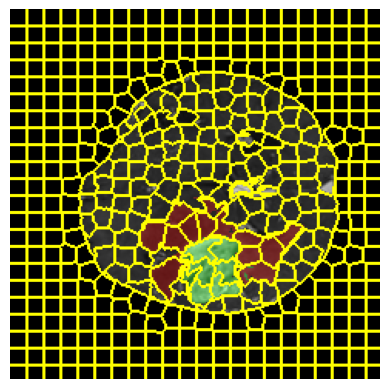

...

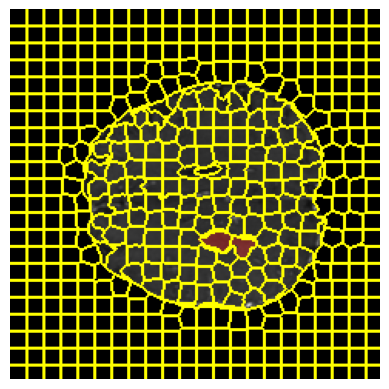

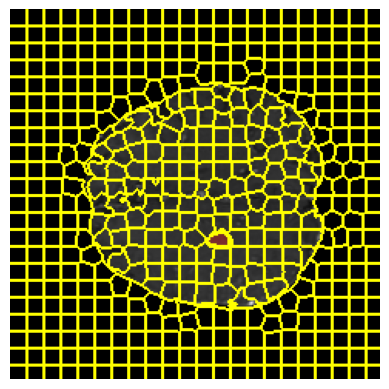

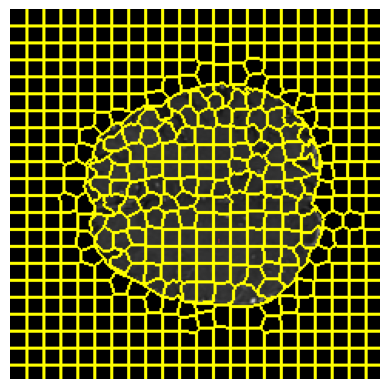

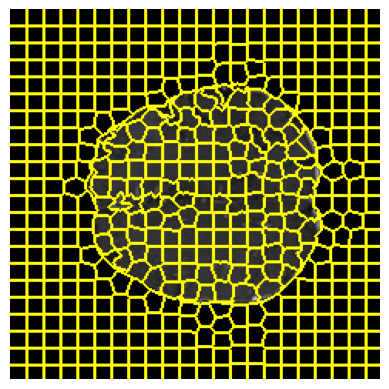

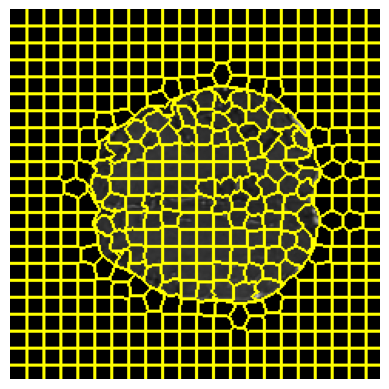

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
# train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
print(x.shape)
print(y.shape)
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()

mixed = color_img + 0.3*color_mask
slices = np.stack(mixed[0, ..., range(40, 110, 2), :], axis=0)
print(slices.shape)
print(np.stack(y[0, ..., range(40, 110, 2), :], axis=0).shape)
numSegments = 500
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=1)

    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(mark_boundaries(slice, segments))
    plt.axis("off")
    plt.show()

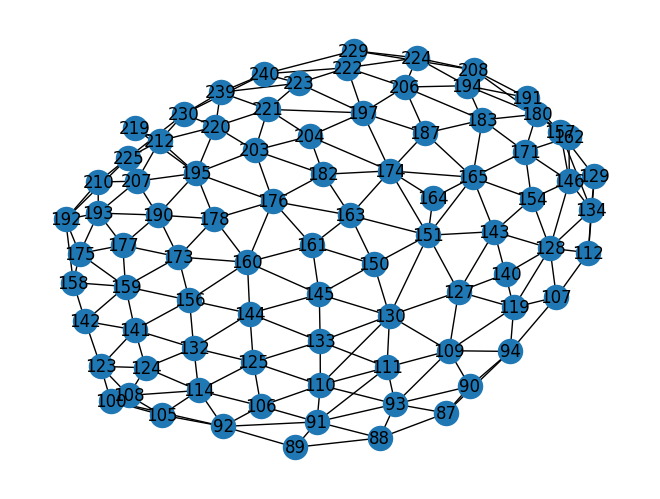

In [ ]:
import matplotlib.pyplot as plt

# Draw the graph
nx.draw(graph[7], with_labels=True)

# Show the plot
plt.show()

In [ ]:
train_sample = next(iter(train_dataloader))


In [ ]:
def labeled_segments(segments, label_slice, overlap_threshold=0.5):
    overlapping_segments = []

    # Iterate over unique segment IDs
    for segment_id in np.unique(segments):
        # Create a mask for the current segment
        segment_mask = segments == segment_id

        # Calculate the overlap ratio
        # print(label_slice[segment_mask][1])
        
        overlap_ratio = np.sum(label_slice[segment_mask]) / np.sum(segment_mask)

        # Check if the overlap ratio is above the threshold
        if overlap_ratio > overlap_threshold:
            overlapping_segments.append(segment_id)

    return overlapping_segments

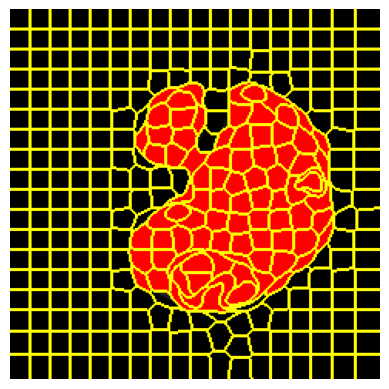

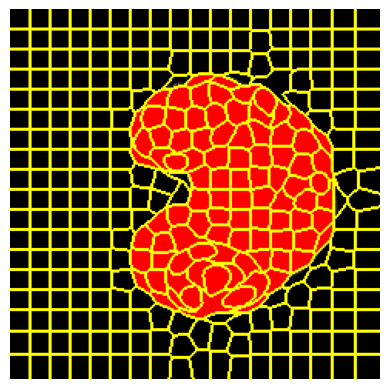

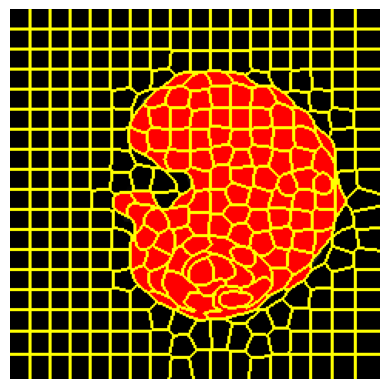

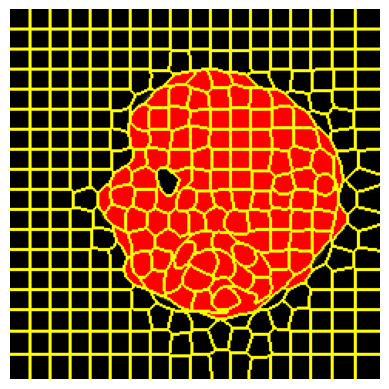

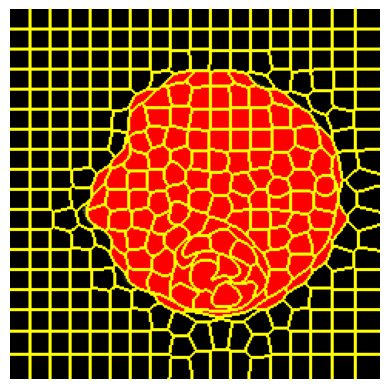

...

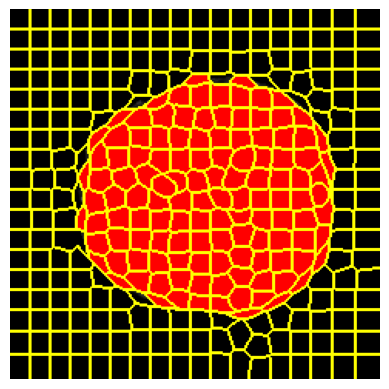

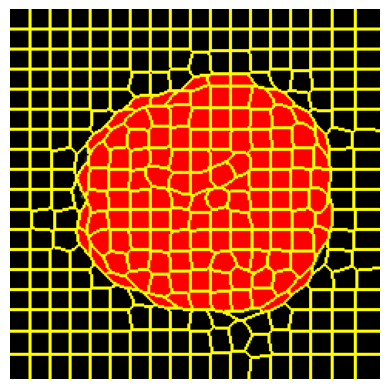

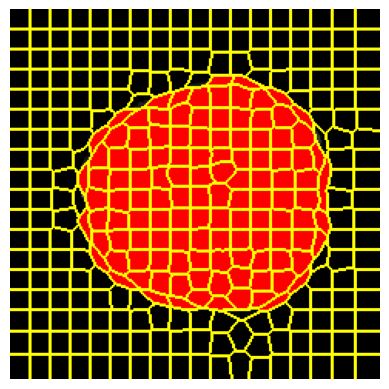

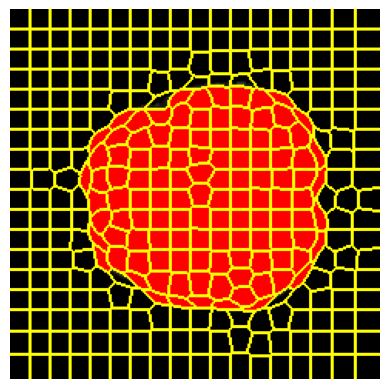

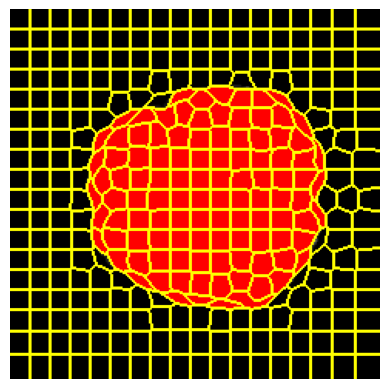

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
# train_sample = next(iter(train_dataloader))
x = train_sample['image'][tio.DATA]
y = train_sample['label'][tio.DATA]
color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
shape=color_img.shape
for i in range(2):
    color_mask=np.zeros(shape)
    color_mask[0, :, :, :, i] = y[0, i].cpu().detach().numpy()
mixed = 1*color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
numSegments = 350
graph=[]
for i, slice in enumerate(slices):
    segments = slic(slice, n_segments=numSegments, sigma=4)
    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)
    segments_to_highlight = high(unique_segments,slice,segments,avg)
    l=[]
    graph.append(making_graph(slice, segments,segments_to_highlight,l))
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    highlol=highlight_segments(slice, segments, segments_to_highlight)
    ax.imshow(mark_boundaries(highlol, segments))
    plt.axis("off")
    plt.show()

In [ ]:
graph=[]


torch.Size([2, 240, 240, 14])
(2, 240, 240, 14)
(14, 240, 240, 1)


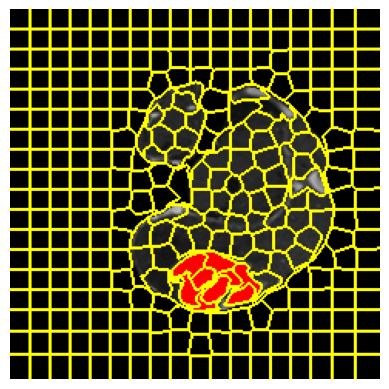

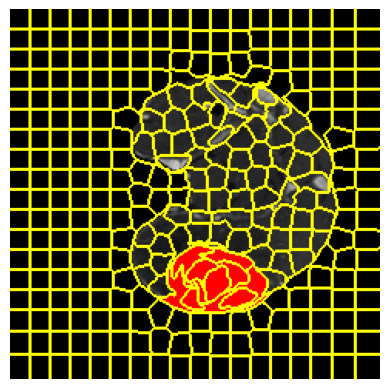

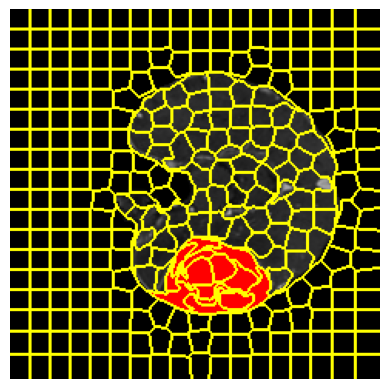

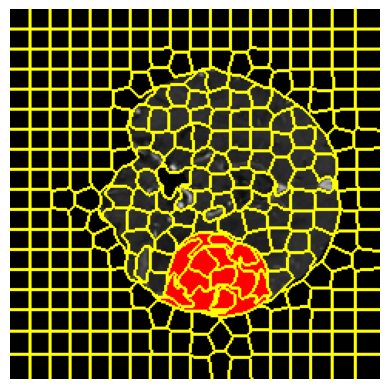

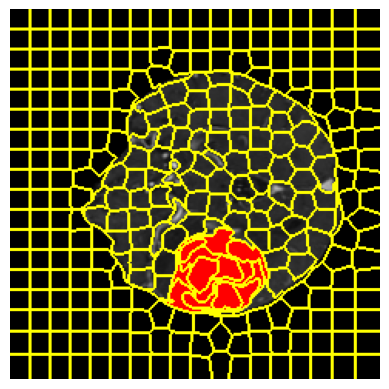

...

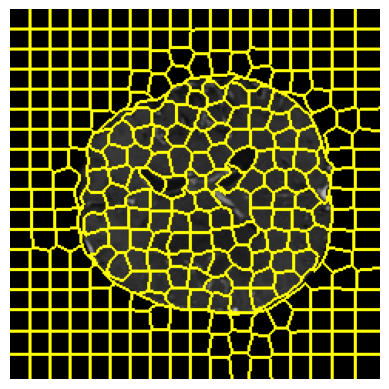

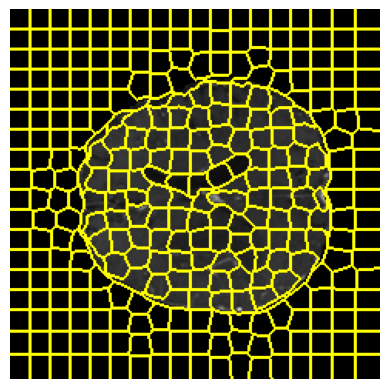

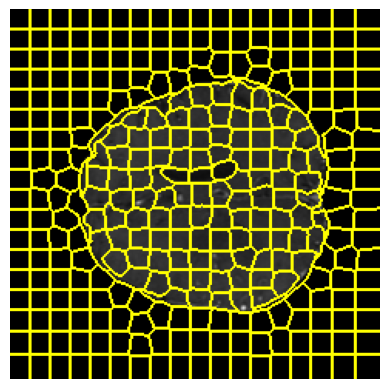

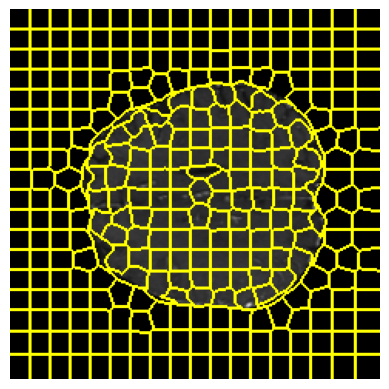

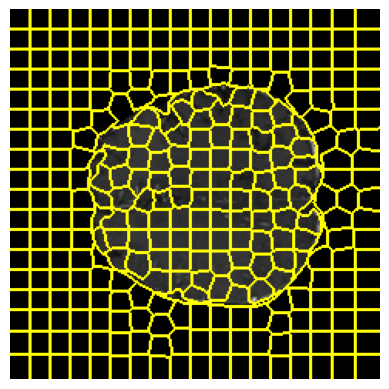

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
x = train_sample['image'][tio.DATA]

y = train_sample['label'][tio.DATA]

color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()
mixed = color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
slices.shape
numSegments = 350
print(y[0, ..., range(40, 110, 5)].shape)
label_slices = np.stack(y[0, ..., range(40, 110, 5)], axis=0)
print(label_slices.shape)
label_slices = np.transpose(label_slices, (3, 1, 2, 0))
label_slices = label_slices[..., 1:2]
print(label_slices.shape)

for i, (slice, label_slice) in enumerate(zip(slices, label_slices)):
    
    segments = slic(slice, n_segments=numSegments, sigma=2)

    

    labled_stuff=labeled_segments(segments,label_slice,0.5)
    slice2=highlight_segments(slice, segments, labled_stuff)

    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)  
    
    segments_to_highlight = high(unique_segments,slice,segments,avg)

    graph.append(making_graph(slice, segments,segments_to_highlight,labled_stuff))


    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(mark_boundaries(slice2, segments))
    plt.axis("off")
    plt.show()

In [ ]:
len(graph)

14

In [ ]:
for i in graph[4].nodes(data=True):
    print(i)

(68, {'area': 138, 'intensity': 0.14638148, 'label': 0})
(70, {'area': 162, 'intensity': 0.16207011, 'label': 0})
(71, {'area': 137, 'intensity': 0.14654697, 'label': 0})
(72, {'area': 224, 'intensity': 0.1659817, 'label': 0})
(73, {'area': 182, 'intensity': 0.142602, 'label': 0})
(74, {'area': 219, 'intensity': 0.18144612, 'label': 0})
(75, {'area': 154, 'intensity': 0.1662488, 'label': 0})
(85, {'area': 184, 'intensity': 0.19284274, 'label': 0})
(86, {'area': 167, 'intensity': 0.15427306, 'label': 0})
(87, {'area': 167, 'intensity': 0.16131656, 'label': 0})
(89, {'area': 167, 'intensity': 0.16370921, 'label': 0})
(90, {'area': 191, 'intensity': 0.16792972, 'label': 0})
(91, {'area': 190, 'intensity': 0.17292537, 'label': 0})
(92, {'area': 210, 'intensity': 0.14185846, 'label': 0})
(93, {'area': 163, 'intensity': 0.16266099, 'label': 0})
(94, {'area': 185, 'intensity': 0.17389761, 'label': 0})
(103, {'area': 189, 'intensity': 0.18605058, 'label': 0})
(104, {'area': 195, 'intensity': 0

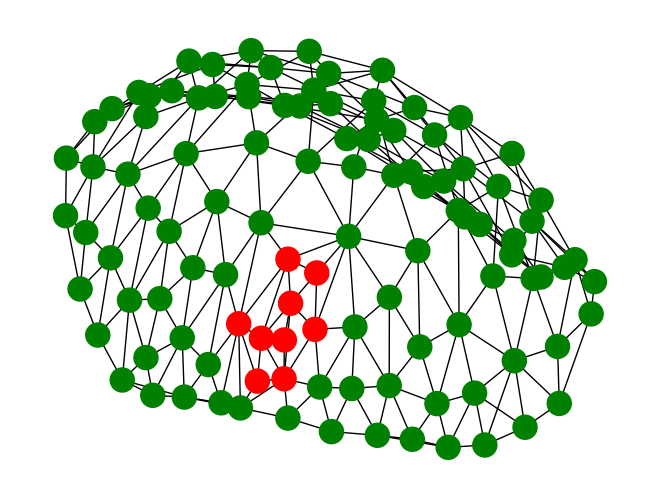

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming G is your graph
colors = ['red' if graph[5].nodes[n].get('label') == 1 else 'green' for n in graph[5].nodes]
nx.draw(graph[5], node_color=colors)
plt.show()

In [ ]:
G = graph[7]

# Iterate over all edges and print their weights (contact lengths)
for (u, v, attr) in G.edges(data=True):
    contact_length = attr['weight']
    print(f"Contact length between segment {u} and segment {v}: {contact_length}")

Contact length between segment 68 and segment 69: 50
Contact length between segment 68 and segment 70: 52
Contact length between segment 68 and segment 72: 28
Contact length between segment 68 and segment 75: 16
Contact length between segment 68 and segment 77: 86
Contact length between segment 69 and segment 72: 80
Contact length between segment 69 and segment 73: 56
Contact length between segment 70 and segment 71: 36
Contact length between segment 70 and segment 75: 76
Contact length between segment 71 and segment 74: 104
Contact length between segment 71 and segment 75: 70
Contact length between segment 71 and segment 93: 66
Contact length between segment 72 and segment 77: 56
Contact length between segment 72 and segment 73: 58
Contact length between segment 72 and segment 90: 74
Contact length between segment 73 and segment 84: 60
Contact length between segment 73 and segment 91: 26
Contact length between segment 73 and segment 90: 6
Contact length between segment 73 and segment 

In [ ]:
def normalizing(graphs):
    for G in graphs:
        max_area = max([G.nodes[n]['area'] for n in G.nodes])
        max_intensity = max([G.nodes[n]['intensity'] for n in G.nodes])
        min_intensity = min([G.nodes[n]['intensity'] for n in G.nodes])
        min_area= min([G.nodes[n]['area'] for n in G.nodes])

        for n in G.nodes:
            G.nodes[n]['area'] /= (max_area-min_area)
            G.nodes[n]['intensity'] /= (max_intensity-min_intensity)

In [ ]:
for i in graph:
    for j in i.nodes(data=True):
        print(j)

(73, {'area': 129, 'intensity': 0.12556782, 'label': 0})
(74, {'area': 201, 'intensity': 0.24523994, 'label': 0})
(75, {'area': 139, 'intensity': 0.15648346, 'label': 0})
(77, {'area': 278, 'intensity': 0.18138397, 'label': 0})
(88, {'area': 248, 'intensity': 0.07261797, 'label': 0})
(90, {'area': 177, 'intensity': 0.18044606, 'label': 0})
(91, {'area': 115, 'intensity': 0.24192691, 'label': 0})
(92, {'area': 194, 'intensity': 0.15642326, 'label': 0})
(93, {'area': 155, 'intensity': 0.14449608, 'label': 0})
(94, {'area': 117, 'intensity': 0.16343662, 'label': 0})
(106, {'area': 183, 'intensity': 0.14814775, 'label': 0})
(107, {'area': 205, 'intensity': 0.16655424, 'label': 0})
(108, {'area': 138, 'intensity': 0.13865347, 'label': 0})
(109, {'area': 200, 'intensity': 0.14535378, 'label': 0})
(110, {'area': 211, 'intensity': 0.14679267, 'label': 0})
(112, {'area': 188, 'intensity': 0.15504271, 'label': 0})
(114, {'area': 126, 'intensity': 0.12624387, 'label': 0})
(122, {'area': 182, 'int

In [ ]:
normalizing(graph)

In [ ]:
for i in graph:
    for j in i.nodes(data=True):
        print(j)

(73, {'area': 0.6262135922330098, 'intensity': 0.31874302, 'label': 0})
(74, {'area': 0.9757281553398058, 'intensity': 0.6225203, 'label': 0})
(75, {'area': 0.6747572815533981, 'intensity': 0.3972197, 'label': 0})
(77, {'area': 1.3495145631067962, 'intensity': 0.46042746, 'label': 0})
(88, {'area': 1.203883495145631, 'intensity': 0.18433441, 'label': 0})
(90, {'area': 0.8592233009708737, 'intensity': 0.45804667, 'label': 0})
(91, {'area': 0.558252427184466, 'intensity': 0.61411047, 'label': 0})
(92, {'area': 0.941747572815534, 'intensity': 0.39706686, 'label': 0})
(93, {'area': 0.7524271844660194, 'intensity': 0.36679077, 'label': 0})
(94, {'area': 0.5679611650485437, 'intensity': 0.4148697, 'label': 0})
(106, {'area': 0.8883495145631068, 'intensity': 0.37606022, 'label': 0})
(107, {'area': 0.9951456310679612, 'intensity': 0.4227835, 'label': 0})
(108, {'area': 0.6699029126213593, 'intensity': 0.35195982, 'label': 0})
(109, {'area': 0.970873786407767, 'intensity': 0.36896795, 'label': 

In [ ]:
graph=[]


In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
for j in range(200):
    print(j)
    train_sample = next(iter(train_dataloader))

    x = train_sample['image'][tio.DATA]

    y = train_sample['label'][tio.DATA]

    color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
    for i in range(2):
        color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()

    mixed = color_img 
    slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
    slices.shape
    numSegments = 350
    label_slices = np.stack(y[0, ..., range(40, 110, 5)], axis=0)

    label_slices = np.transpose(label_slices, (3, 1, 2, 0))
    label_slices = label_slices[..., 1:2]


    for i, (slice, label_slice) in enumerate(zip(slices, label_slices)):
        
        segments = slic(slice, n_segments=numSegments, sigma=2)

        

        labled_stuff=labeled_segments(segments,label_slice,0.6)
        slice2=highlight_segments(slice, segments, labled_stuff)

        unique_segments = np.unique(segments)
        avg=average_color(slice, segments)  
        
        segments_to_highlight = high(unique_segments,slice,segments,avg)

        graph.append(making_graph(slice, segments,segments_to_highlight,labled_stuff))

        # fig = plt.figure("Superpixels -- %d segments" % (numSegments))
        # ax = fig.add_subplot(1, 1, 1)
        # ax.imshow(mark_boundaries(slice2, segments))
        # plt.axis("off")
        # plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


this was preprocessing

now model time

# Models


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv

class GAT(nn.Module):
    def __init__(self, in_channels, out_channels, heads):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, out_channels, heads=heads)
        self.conv2 = GATConv(out_channels*heads, 2, heads=1)

    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)
     


In [ ]:
from torch_geometric.nn import SAGEConv
import torch.nn.functional as F
class GraphSAGE(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.5, training=self.training)
        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x)

In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

class SimpleGCN(torch.nn.Module):
    def __init__(self, num_node_features, num_classes):
        super(SimpleGCN, self).__init__()
        self.conv1 = GCNConv(num_node_features, 16)  
        self.conv2 = GCNConv(16, num_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)

        return F.log_softmax(x, dim=1)

In [ ]:
model = SimpleGCN(num_node_features=2, num_classes=2)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
loss_func = F.nll_loss

In [ ]:
len(graph)

14

In [ ]:
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx

# Convert NetworkX graphs to PyG graphs
pyg_graphs = [from_networkx(g) for g in graph]


In [ ]:
model = GraphSAGE(2, 16, 2)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
for g in graph:
    g.x = torch.tensor([[data['area'], data['intensity']] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.y = torch.tensor([data['lable'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)

In [ ]:
model = GAT(2, 8,5)
# Define the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
g2=[]

In [ ]:
for g in graph:
    g.x = torch.tensor([[data['area'], data['intensity']] for _, data in g.nodes(data=True)], dtype=torch.float)
    # print(g.x)
    g.y = torch.tensor([data['label'] for _, data in g.nodes(data=True)], dtype=torch.float)
    g.edge_attr = torch.tensor([data['weight'] for _, _, data in g.edges(data=True)], dtype=torch.float)    
    g2.append(g)

In [ ]:
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx

# Convert NetworkX graphs to PyG graphs
pyg_graphs = [from_networkx(g) for g in graph]




In [ ]:
len(graph)

2828

In [ ]:

for g in pyg_graphs:
    print(g)

Data(edge_index=[2, 388], area=[76], intensity=[76], label=[76], weight=[388], num_nodes=76)
Data(edge_index=[2, 434], area=[83], intensity=[83], label=[83], weight=[434], num_nodes=83)
Data(edge_index=[2, 470], area=[88], intensity=[88], label=[88], weight=[470], num_nodes=88)
Data(edge_index=[2, 522], area=[97], intensity=[97], label=[97], weight=[522], num_nodes=97)
Data(edge_index=[2, 568], area=[104], intensity=[104], label=[104], weight=[568], num_nodes=104)
Data(edge_index=[2, 594], area=[108], intensity=[108], label=[108], weight=[594], num_nodes=108)
Data(edge_index=[2, 604], area=[109], intensity=[109], label=[109], weight=[604], num_nodes=109)
Data(edge_index=[2, 638], area=[116], intensity=[116], label=[116], weight=[638], num_nodes=116)
Data(edge_index=[2, 624], area=[113], intensity=[113], label=[113], weight=[624], num_nodes=113)
Data(edge_index=[2, 618], area=[113], intensity=[113], label=[113], weight=[618], num_nodes=113)
Data(edge_index=[2, 628], area=[112], intensit

In [ ]:
a=pyg_graphs[2]
print(a)

Data(edge_index=[2, 470], area=[88], intensity=[88], label=[88], weight=[470], num_nodes=88)


In [ ]:
print(a.intensity)

tensor([0.1572, 0.1450, 0.1557, 0.1763, 0.1631, 0.1706, 0.1643, 0.1727, 0.1706,
        0.1659, 0.1535, 0.1802, 0.1443, 0.1761, 0.1450, 0.1819, 0.1544, 0.1486,
        0.1680, 0.1718, 0.1462, 0.1704, 0.1549, 0.1425, 0.1867, 0.1876, 0.2009,
        0.1509, 0.2040, 0.1627, 0.1732, 0.1753, 0.1923, 0.1418, 0.1397, 0.1715,
        0.1597, 0.1247, 0.2619, 0.1373, 0.2977, 0.1109, 0.1669, 0.1493, 0.1398,
        0.1729, 0.1641, 0.0778, 0.1355, 0.1714, 0.1313, 0.1203, 0.1768, 0.2363,
        0.1638, 0.1681, 0.1693, 0.1331, 0.1450, 0.1508, 0.1314, 0.1632, 0.1201,
        0.2242, 0.1848, 0.1403, 0.1325, 0.1236, 0.3315, 0.4311, 0.3124, 0.1789,
        0.1199, 0.1332, 0.1631, 0.1028, 0.0912, 0.1878, 0.3044, 0.1405, 0.1618,
        0.2961, 0.2138, 0.2066, 0.1438, 0.2340, 0.3177, 0.4945])


In [ ]:
print(a.label)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
        0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1])


In [ ]:
import torch
from torch_geometric.data import Data

In [ ]:
import torch
from torch_geometric.data import Data

# Node feature matrix (x) with shape [num_nodes, num_node_features]
# Here, we have 3 nodes, each with 2 features
x = torch.tensor([[2, 1], 
                  [5, 6], 
                  [3, 7]], dtype=torch.float)

# Node labels (y) with shape [num_nodes]
# Here, we have 3 nodes, each with a label (0, 1, or 2)
y = torch.tensor([0, 1, 2], dtype=torch.long)

# Edge index (edge_index) with shape [2, num_edges]
# Here, we have 3 edges: (0, 1), (1, 2), and (2, 0)
edge_index = torch.tensor([[0, 1, 2],
                           [1, 2, 0]], dtype=torch.long)

data = Data(x=x, edge_index=edge_index, y=y)

c:\g\pproject\aimbot\bot\bot\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
model = GraphSAGE(data.num_features, 16, 3)

# Define the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
# Train the model
model.train()
for epoch in range(2):
    optimizer.zero_grad()
    out = model([data.x], data.edge_index)
    loss = F.nll_loss(out[data.train_mask], data.y[data.train_mask])
    print(f"loss:{loss}, epoch:{epoch}")
    loss.backward()
    optimizer.step()

In [ ]:
# data.train_mask = torch.tensor([True, True, False], dtype=torch.bool)  # Assuming all nodes are for training

def train(data):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = loss_func(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

# Run the training loop for a number of epochs
epochs = 200
for epoch in range(epochs):
    loss = train(data)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {loss:.4f}')

NameError: name 'data' is not defined

In [ ]:
loader=pyg_graphs

In [ ]:
import torch.nn as nn
loss_func = nn.CrossEntropyLoss()

In [ ]:
loss_func = nn.MSELoss()

In [ ]:
# Define the loss function for binary classification
loss_func = nn.BCEWithLogitsLoss()

In [ ]:
for epoch in range(5):
    for batch in loader:
        optimizer.zero_grad()
        # Corrected concatenation
        node_features = torch.cat((batch.area.unsqueeze(1), batch.intensity.unsqueeze(1)), dim=1)
        out = model(node_features, batch.edge_index) 
         # Ensure your model can handle batched data
        train_mask= torch.tensor([True for i in range(batch.num_nodes)], dtype=torch.bool)
        loss = loss_func(out[train_mask], batch.label[train_mask])
        loss.backward()
        print(f'Epoch {epoch+1}, Loss: {loss.item()}')
        optimizer.step()

Epoch 1, Loss: 5.875895023345947
Epoch 1, Loss: 6.5442070960998535
Epoch 1, Loss: 5.456661701202393
Epoch 1, Loss: 4.699070453643799
Epoch 1, Loss: 6.588345527648926
Epoch 1, Loss: 6.085724830627441
Epoch 1, Loss: 4.839735984802246
Epoch 1, Loss: 7.398589134216309
Epoch 1, Loss: 8.56747055053711
Epoch 1, Loss: 6.285400867462158
Epoch 1, Loss: 5.744853973388672
Epoch 1, Loss: 5.1152143478393555
Epoch 1, Loss: 0.7709531188011169
Epoch 1, Loss: 1.1083970069885254
Epoch 1, Loss: 1.1752203135984018e-05
Epoch 1, Loss: 0.034792210906744
Epoch 1, Loss: 0.0039068260230124
Epoch 1, Loss: 0.7740780115127563
Epoch 1, Loss: 4.59168815612793
Epoch 1, Loss: 1.6633102893829346
Epoch 1, Loss: 3.853261947631836
Epoch 1, Loss: 3.9649322032928467
Epoch 1, Loss: 3.744840621948242
Epoch 1, Loss: 2.4352900981903076
Epoch 1, Loss: 0.7447571754455566
Epoch 1, Loss: 1.4022725820541382
Epoch 1, Loss: 0.5915049314498901
Epoch 1, Loss: 0.1035013198852539
Epoch 1, Loss: 0.10282383114099503
Epoch 1, Loss: 0.67646402

In [ ]:
new_graph_node_features=torch.cat((pyg_graphs[4].area.unsqueeze(1), pyg_graphs[4].intensity.unsqueeze(1)), dim=1)
new_graph_edge_index=pyg_graphs[4].edge_index
with torch.no_grad():  # Disable gradient computation for inference
    predictions = model(new_graph_node_features, new_graph_edge_index)

# Process the predictions as needed (e.g., apply softmax for classification tasks)
# For a multi-class classification task
probabilities = torch.softmax(predictions, dim=1)
predicted_class = probabilities.argmax(dim=1)

print("Predicted class probabilities:", probabilities)
print( predicted_class)
print( pyg_graphs[4].label) 

Predicted class probabilities: tensor([[0.9836, 0.0164],
        [0.9984, 0.0016],
        [0.9968, 0.0032],
        [0.9941, 0.0059],
        [0.9527, 0.0473],
        [0.7557, 0.2443],
        [0.9693, 0.0307],
        [0.9941, 0.0059],
        [0.9769, 0.0231],
        [0.1351, 0.8649],
        [0.9729, 0.0271],
        [0.0186, 0.9814],
        [0.9613, 0.0387],
        [0.9525, 0.0475],
        [0.0202, 0.9798],
        [0.2103, 0.7897],
        [0.8873, 0.1127],
        [0.9704, 0.0296],
        [0.9569, 0.0431],
        [0.9367, 0.0633],
        [0.0201, 0.9799],
        [0.9628, 0.0372],
        [0.0173, 0.9827],
        [0.8613, 0.1387],
        [0.9344, 0.0656],
        [0.9571, 0.0429],
        [0.9487, 0.0513],
        [0.9575, 0.0425],
        [0.9458, 0.0542],
        [0.4782, 0.5218],
        [0.0146, 0.9854],
        [0.9669, 0.0331],
        [0.9681, 0.0319],
        [0.5987, 0.4013],
        [0.9390, 0.0610],
        [0.8775, 0.1225],
        [0.3681, 0.6319],
       

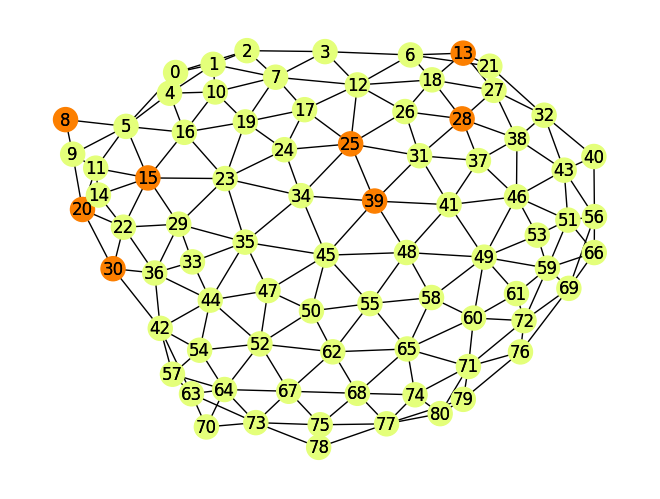

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert edge_index to a list of edges
edges = new_graph_edge_index.t().cpu().numpy().tolist()

# Create a NetworkX graph from the edges
G = nx.Graph()
G.add_edges_from(edges)

# Use the predicted_class tensor for node colors
node_colors = predicted_class.cpu().numpy()

# Optionally, if you want to visualize the true labels alongside predictions:
true_labels = pyg_graphs[4].label.cpu().numpy()  # Assuming this is a tensor of labels

# Add node attributes for visualization (e.g., predicted class, true label)
for i, (pred, true) in enumerate(zip(predicted_class, true_labels)):
    G.nodes[i]['predicted_class'] = pred.item()
    # G.nodes[i]['true_label'] = true.item()

# Draw the graph
pos = nx.spring_layout(G)  # positions for all nodes

# Drawing nodes with the node color determined by the predicted class
nx.draw(G, pos, node_color=node_colors, with_labels=True, cmap=plt.cm.Wistia)

# If you want to add labels to the nodes to show the predicted class:
node_labels = nx.get_node_attributes(G, 'predicted_class')
nx.draw_networkx_labels(G, pos)

plt.show()

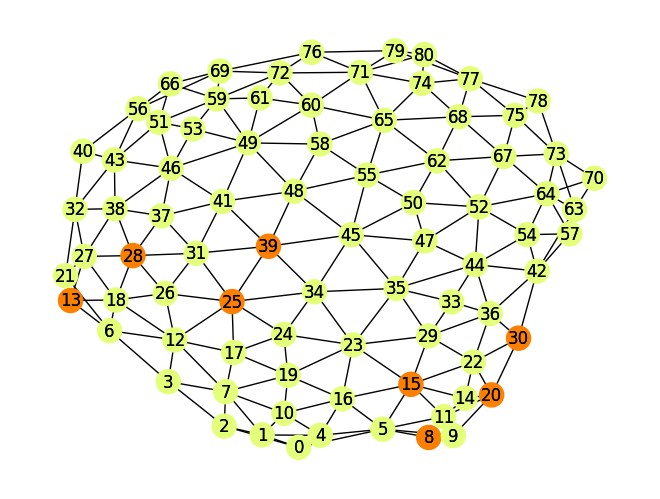

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert edge_index to a list of edges
edges = new_graph_edge_index.t().cpu().numpy().tolist()

# Create a NetworkX graph from the edges

G = nx.Graph()
G.add_edges_from(edges)

# Use the predicted_class tensor for node colors
node_colors = predicted_class.cpu().numpy()

# Optionally, if you want to visualize the true labels alongside predictions:
# true_labels = pyg_graphs[4].label.cpu().numpy()  # Assuming this is a tensor of labels

# Add node attributes for visualization (e.g., predicted class, true label)
for i, (pred, true) in enumerate(zip(predicted_class, true_labels)):
    # G.nodes[i]['predicted_class'] = pred.item()
    G.nodes[i]['true_label'] = true.item()

# Draw the graph
pos = nx.spring_layout(G)  # positions for all nodes

# Drawing nodes with the node color determined by the predicted class
nx.draw(G, pos, node_color=node_colors, with_labels=True, cmap=plt.cm.Wistia)

# If you want to add labels to the nodes to show the predicted class:
node_labels = nx.get_node_attributes(G, 'true_label')
nx.draw_networkx_labels(G, pos)

plt.show()

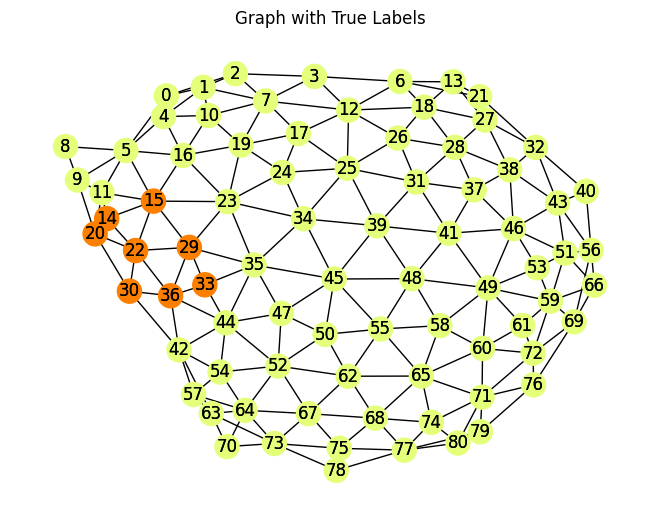

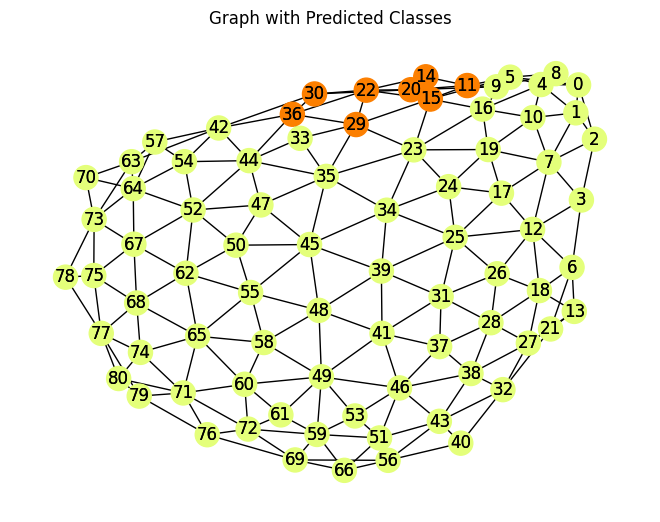

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming new_graph_edge_index, predicted_class, and true_labels are defined as before

# Convert edge_index to a list of edges
edges = new_graph_edge_index.t().cpu().numpy().tolist()

# Create a NetworkX graph from the edges
G = nx.Graph()
G.add_edges_from(edges)

# Add node attributes for visualization (e.g., predicted class, true label)
for i, (pred, true) in enumerate(zip(predicted_class, true_labels)):
    G.nodes[i]['predicted_class'] = pred.item()
    G.nodes[i]['true_label'] = true.item()

# Function to draw the graph with node colors based on labels
def draw_graph(G, attribute, title, cmap=plt.cm.Wistia):
    # Extract the attribute to color nodes
    node_colors = [G.nodes[i][attribute] for i in G.nodes()]
    
    # Draw the graph
    pos = nx.spring_layout(G)  # positions for all nodes
    nx.draw(G, pos, node_color=node_colors, with_labels=True, cmap=cmap)
    
    # Drawing labels
    node_labels = nx.get_node_attributes(G, attribute)
    nx.draw_networkx_labels(G, pos)
    
    plt.title(title)
    plt.show()

# Draw the graph with true labels
draw_graph(G, 'true_label', 'Graph with True Labels')

# Draw the graph with predicted classes
draw_graph(G, 'predicted_class', 'Graph with Predicted Classes')

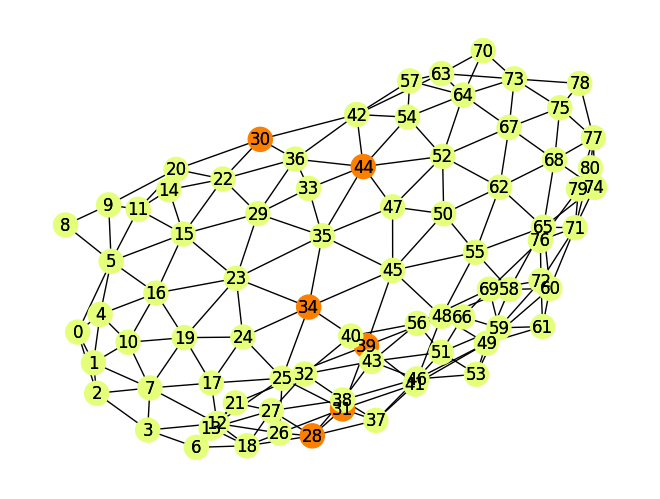

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert edge_index to a list of edges
edges = new_graph_edge_index.t().cpu().numpy().tolist()

# Create a NetworkX graph from the edges
G = nx.Graph()
G.add_edges_from(edges)

# Use the predicted_class tensor for node colors
node_colors = predicted_class.cpu().numpy()

# Add node attributes for visualization (e.g., predicted class)
for i, pred in enumerate(predicted_class):
    G.nodes[i]['predicted_class'] = pred.item()

# Draw the graph
pos = nx.spring_layout(G)  # positions for all nodes

# Drawing nodes with the node color determined by the predicted class
nx.draw(G, pos, node_color=node_colors, with_labels=True, cmap=plt.cm.Wistia)

# If you want to add labels to the nodes to show the predicted class:
node_labels = nx.get_node_attributes(G, 'predicted_class')
nx.draw_networkx_labels(G, pos)

plt.show()

(14, 240, 240, 3)
(14, 240, 240, 2)
14
14


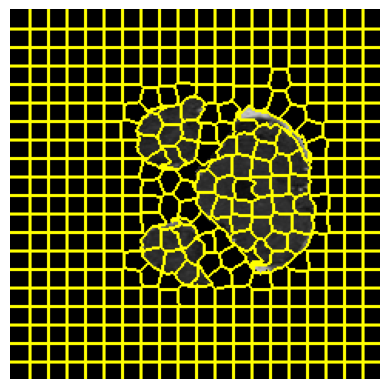

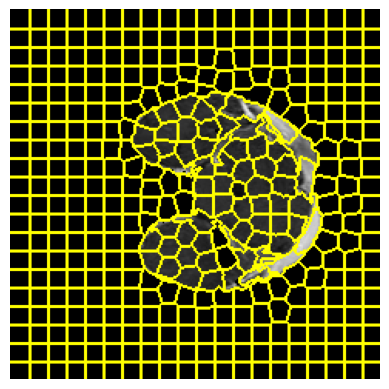

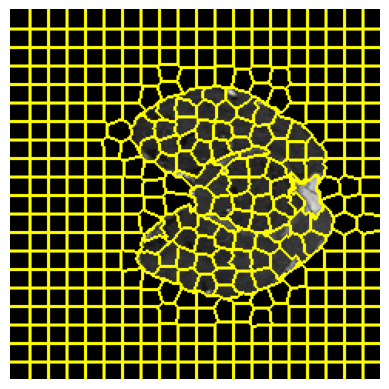

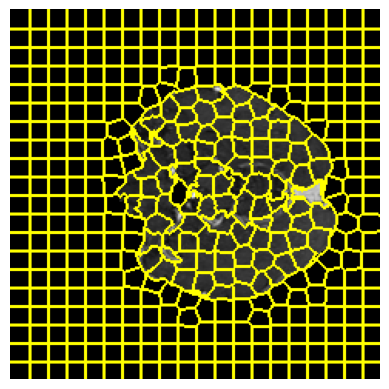

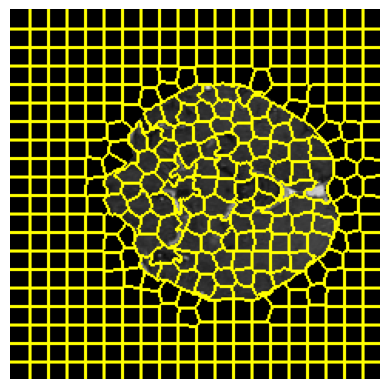

...

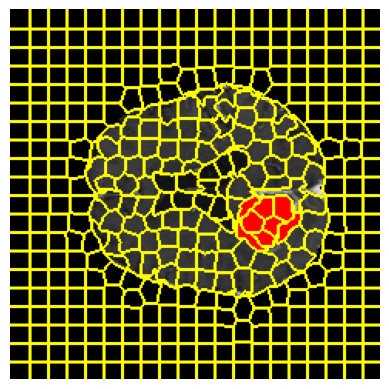

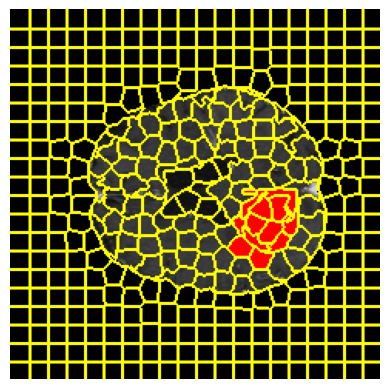

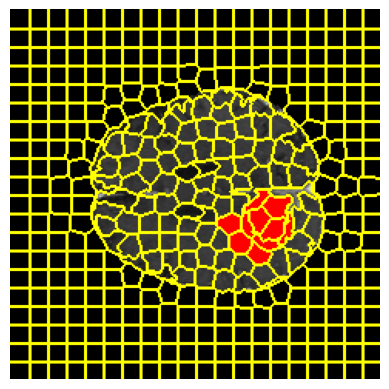

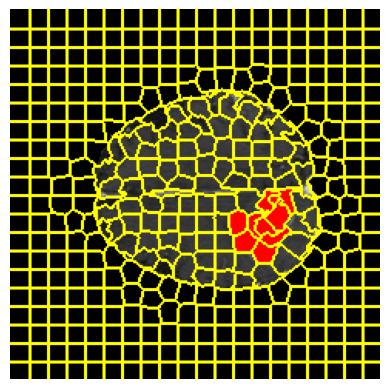

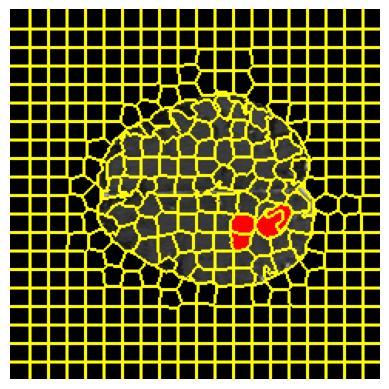

In [ ]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
x = train_sample['image'][tio.DATA]

y = train_sample['label'][tio.DATA]

color_img = np.stack([x[0].cpu().detach().numpy()] * 3, axis=-1)
for i in range(2):
    color_mask[0, :, :, :, i] = y[0,i].cpu().detach().numpy()

mixed = color_img 
slices = np.stack(mixed[0, ..., range(40, 110, 5), :], axis=0)
slices.shape
numSegments = 375
label_slices = np.stack(y[0, ..., range(40, 110, 5)], axis=0)
label_slices = np.transpose(label_slices, (3, 1, 2, 0))
print(slices.shape)
print(label_slices.shape)
print(len(slices))
print(len(label_slices))
graphhhs=[]
slixcess=[ ]
for i, (slice, label_slice) in enumerate(zip(slices, label_slices)):
    
    segments = slic(slice, n_segments=numSegments, sigma=1)

    

    labled_stuff=labeled_segments(segments,label_slice,0.65)
    slice2=highlight_segments(slice, segments, labled_stuff)

    unique_segments = np.unique(segments)
    avg=average_color(slice, segments)  
    
    segments_to_highlight = high(unique_segments,slice,segments,avg)

    graphhhs.append(making_graph(slice, segments,segments_to_highlight,labled_stuff))
    slixcess.append(slice)
    fig = plt.figure("Superpixels -- %d segments" % (numSegments))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(mark_boundaries(slice2, segments))
    plt.axis("off")
    plt.show()

In [ ]:
from torch_geometric.data import Data
from torch_geometric.utils import from_networkx

# Convert NetworkX graphs to PyG graphs
pyg_graphhhhs = [from_networkx(g) for g in graphhhs]

In [ ]:
new_graph_node_features=torch.cat((pyg_graphs[4].area.unsqueeze(1), pyg_graphs[4].intensity.unsqueeze(1)), dim=1)
new_graph_edge_index=pyg_graphs[4].edge_index
with torch.no_grad():  # Disable gradient computation for inference
    predictions = model(new_graph_node_features, new_graph_edge_index)

# Process the predictions as needed (e.g., apply softmax for classification tasks)
# For a multi-class classification task
probabilities = torch.softmax(predictions, dim=1)
predicted_class = probabilities.argmax(dim=1)

print("Predicted class probabilities:", probabilities)
print( predicted_class)
print( pyg_graphs[4].label) 

In [ ]:
new_graph_node_features=torch.cat((pyg_graphhhhs[7].area.unsqueeze(1), pyg_graphhhhs[7].intensity.unsqueeze(1)), dim=1)
new_graph_edge_index=pyg_graphhhhs[7].edge_index
with torch.no_grad():  # Disable gradient computation for inference
    predictions = model(new_graph_node_features, new_graph_edge_index)

# Process the predictions as needed (e.g., apply softmax for classification tasks)
# For a multi-class classification task
probabilities = torch.softmax(predictions, dim=1)
predicted_class = probabilities.argmax(dim=1)

print("Predicted class probabilities:", probabilities)
print( predicted_class)


print( pyg_graphhhhs[7].label) 

Predicted class probabilities: tensor([[9.9748e-01, 2.5237e-03],
        [9.9876e-01, 1.2442e-03],
        [9.9234e-01, 7.6592e-03],
        [9.9949e-01, 5.1430e-04],
        [9.9220e-01, 7.7994e-03],
        [9.9034e-01, 9.6560e-03],
        [9.9836e-01, 1.6378e-03],
        [9.9897e-01, 1.0330e-03],
        [9.9681e-01, 3.1942e-03],
        [9.9782e-01, 2.1763e-03],
        [9.8809e-01, 1.1910e-02],
        [9.9964e-01, 3.6149e-04],
        [9.9949e-01, 5.0941e-04],
        [9.9773e-01, 2.2726e-03],
        [9.9650e-01, 3.4983e-03],
        [9.8724e-01, 1.2755e-02],
        [9.9964e-01, 3.6156e-04],
        [9.9511e-01, 4.8860e-03],
        [9.9985e-01, 1.4809e-04],
        [9.9862e-01, 1.3822e-03],
        [9.8578e-01, 1.4219e-02],
        [9.9714e-01, 2.8555e-03],
        [9.9401e-01, 5.9865e-03],
        [9.9730e-01, 2.6974e-03],
        [9.9024e-01, 9.7592e-03],
        [9.9969e-01, 3.0615e-04],
        [9.9764e-01, 2.3612e-03],
        [9.9951e-01, 4.8554e-04],
        [9.9698e-

In [ ]:
for i in pyg_graphhhhs:
    new_graph_node_features=torch.cat((i.area.unsqueeze(1), i.intensity.unsqueeze(1)), dim=1)
    new_graph_edge_index=i.edge_index
    with torch.no_grad():  # Disable gradient computation for inference
        predictions = model(new_graph_node_features, new_graph_edge_index)

    # Process the predictions as needed (e.g., apply softmax for classification tasks)
    # For a multi-class classification task
    probabilities = torch.softmax(predictions, dim=1)
    predicted_class = probabilities.argmax(dim=1)

    print("Predicted class probabilities:", probabilities)
    print( predicted_class)


    print( i.label) 

Predicted class probabilities: tensor([[9.9911e-01, 8.9008e-04],
        [9.9972e-01, 2.8073e-04],
        [9.9913e-01, 8.6534e-04],
        [9.9894e-01, 1.0558e-03],
        [9.9868e-01, 1.3240e-03],
        [9.9940e-01, 5.9592e-04],
        [9.9976e-01, 2.3861e-04],
        [9.9902e-01, 9.8258e-04],
        [9.9939e-01, 6.0740e-04],
        [9.9906e-01, 9.3792e-04],
        [9.9873e-01, 1.2669e-03],
        [9.9895e-01, 1.0544e-03],
        [9.9973e-01, 2.7293e-04],
        [9.9993e-01, 6.6236e-05],
        [9.9958e-01, 4.1918e-04],
        [9.9957e-01, 4.2872e-04],
        [9.9957e-01, 4.3475e-04],
        [9.9952e-01, 4.8024e-04],
        [9.8923e-01, 1.0766e-02],
        [9.9026e-01, 9.7369e-03],
        [9.9988e-01, 1.1791e-04],
        [9.9946e-01, 5.3695e-04],
        [9.9987e-01, 1.3023e-04],
        [9.9954e-01, 4.6343e-04],
        [9.9929e-01, 7.1073e-04],
        [9.8953e-01, 1.0469e-02],
        [9.9889e-01, 1.1091e-03],
        [9.9196e-01, 8.0393e-03],
        [9.9907e-